# Burgers parallel initial conditions

In [2]:
import numpy as np
import torch
from tqdm import tqdm
from typing import Callable, List, Tuple, Union
import time

%cd ../src
from plot_utils import plot_sim_result
from burgers_analytic import num_approx_burgers

/home/etienne/Documents/Univ_Lille/M2/project_hGalerkinNN_for_CFD/code/src


In [3]:
class BurgersParallelSolver:
    """
    Optimized parallel Burgers equation solver using PyTorch.
    Supports batch processing of multiple initial conditions with GPU acceleration.
    """
    
    def __init__(self, device: str = None):
        """
        Initialize solver.
        
        Args:
            device: 'cuda', 'cpu', or None (auto-detect)
        """
        if device is None:
            self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        else:
            self.device = torch.device(device)
        
        print(f"Initialized BurgersParallelSolver on device: {self.device}")
        if self.device.type == 'cuda':
            print(f"GPU: {torch.cuda.get_device_name(0)}")
            print(f"GPU Memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.2f} GB")
    
    def vectorized_function_eval(self, func: Callable, q_tensor: torch.Tensor) -> torch.Tensor:
        """
        Efficiently evaluate a function on a tensor, attempting vectorization.
        
        Args:
            func: Function to evaluate
            q_tensor: Input tensor of any shape
            
        Returns:
            Output tensor of same shape
        """
        original_shape = q_tensor.shape
        q_flat = q_tensor.flatten()
        
        # Try vectorized evaluation first
        try:
            # Check if function can handle torch tensors
            test_val = func(q_flat[:1])
            if isinstance(test_val, (torch.Tensor, np.ndarray)):
                result = func(q_flat)
                if isinstance(result, np.ndarray):
                    result = torch.from_numpy(result).to(self.device, dtype=torch.float32)
                return result.reshape(original_shape)
        except:
            pass
        
        # Fall back to numpy evaluation
        q_np = q_flat.cpu().numpy()
        result_np = np.array([func(float(q)) for q in q_np])
        result = torch.from_numpy(result_np).to(self.device, dtype=torch.float32)
        return result.reshape(original_shape)
    
    def solve_parallel(
        self,
        x0_list: List[Callable],
        G_list: List[Callable],
        hz: float,
        ht: float,
        Tmax: float,
        z_range: Tuple[float, float] = (-7.0, 7.0),
        L: float = 6.0,
        n_quad_points: int = 200,
        batch_size: int = None
    ) -> Tuple[np.ndarray, np.ndarray, List[np.ndarray]]:
        """
        Solve Burgers equation for multiple initial conditions in parallel.
        
        Args:
            x0_list: List of initial condition functions
            G_list: List of primitive functions
            hz: Spatial step size
            ht: Time step size
            Tmax: Maximum time
            z_range: Spatial domain range
            L: Integration limit
            n_quad_points: Number of quadrature points
            batch_size: Process this many z-points at once (None = all)
            
        Returns:
            z_vals, t_vals, X_tr_list
        """
        assert z_range[0] < z_range[1]
        assert len(x0_list) == len(G_list)
        
        n_conditions = len(x0_list)
        
        # Create grids
        z_vals = np.arange(z_range[0], z_range[1] + hz, hz)
        t_vals = np.arange(0.0, Tmax + ht, ht)
        n_z = len(z_vals)
        n_t = len(t_vals)
        
        # Quadrature setup
        y_quad = torch.linspace(-L, L, n_quad_points, dtype=torch.float32, device=self.device)
        dy = y_quad[1] - y_quad[0]
        
        # Trapezoidal weights
        weights = torch.ones_like(y_quad)
        weights[0] = 0.5
        weights[-1] = 0.5
        
        # Initialize solutions
        X_tr_batch = torch.zeros(n_conditions, n_t, n_z, dtype=torch.float32, device=self.device)
        
        # Set initial conditions
        print("Setting initial conditions...")
        z_tensor = torch.tensor(z_vals, dtype=torch.float32, device=self.device)
        for ic_idx in range(n_conditions):
            x0_vals = self.vectorized_function_eval(x0_list[ic_idx], z_tensor)
            X_tr_batch[ic_idx, 0, :] = x0_vals
        
        # Determine batch size for z-points
        if batch_size is None:
            batch_size = n_z
        
        # Main time loop
        print(f"Computing solutions for {n_conditions} initial conditions...")
        start_time = time.time()
        
        for t_idx in tqdm(range(1, n_t), desc="Time integration"):
            t_val = t_vals[t_idx]
            sqrt_t = np.sqrt(t_val)
            
            # Process z-points in batches
            for z_start in range(0, n_z, batch_size):
                z_end = min(z_start + batch_size, n_z)
                z_batch = z_tensor[z_start:z_end]
                n_z_batch = len(z_batch)
                
                # Prepare tensors: (n_z_batch, n_quad)
                z_expanded = z_batch.view(-1, 1)  # (n_z_batch, 1)
                y_expanded = y_quad.view(1, -1)   # (1, n_quad)
                
                # q = z + 2*sqrt(t)*y
                q_vals = z_expanded + 2.0 * sqrt_t * y_expanded  # (n_z_batch, n_quad)
                
                # Compute for each initial condition
                for ic_idx in range(n_conditions):
                    # Evaluate functions
                    x0_vals = self.vectorized_function_eval(x0_list[ic_idx], q_vals)
                    G_vals = self.vectorized_function_eval(G_list[ic_idx], q_vals)
                    
                    # Compute exponential term
                    y_sq = y_expanded ** 2
                    exp_term = torch.exp(-y_sq - 0.5 * G_vals)
                    
                    # Integrands
                    numerator_integrand = x0_vals * exp_term
                    denominator_integrand = exp_term
                    
                    # Integrate using trapezoidal rule
                    numerator = torch.sum(numerator_integrand * weights, dim=1) * dy
                    denominator = torch.sum(denominator_integrand * weights, dim=1) * dy
                    
                    # Store result
                    X_tr_batch[ic_idx, t_idx, z_start:z_end] = numerator / denominator
        
        elapsed = time.time() - start_time
        print(f"Computation completed in {elapsed:.2f} seconds")
        print(f"Average time per condition: {elapsed/n_conditions:.2f} seconds")
        
        # Convert to numpy
        X_tr_list = [X_tr_batch[i].cpu().numpy() for i in range(n_conditions)]
        
        return z_vals, t_vals, X_tr_list
    
    def solve_single(
        self,
        x0: Callable,
        G: Callable,
        hz: float,
        ht: float,
        Tmax: float,
        z_range: Tuple[float, float] = (-7.0, 7.0),
        L: float = 6.0,
        n_quad_points: int = 200
    ) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
        """
        Solve for a single initial condition.
        """
        z_vals, t_vals, X_tr_list = self.solve_parallel(
            [x0], [G], hz, ht, Tmax, z_range, L, n_quad_points
        )
        return z_vals, t_vals, X_tr_list[0]



if __name__ == '__main__':
    
    print("\n" + "="*60)
    print("PARALLEL BATCH PROCESSING EXAMPLE")
    print("="*60)
    
    # Define multiple initial conditions
    initial_conditions = []
    primitives = []
    labels = []
    
    # 2. Different hyperbolic profiles
    for i in range(2,1000):
        initial_conditions.append(lambda q: np.tanh(i*q))
        primitives.append(lambda q: (1/float(i))*np.log(np.cosh(float(i)*q)))
        labels.append(f'tanh({1}q)')
    
    print(f"\nSolving for {len(initial_conditions)} initial conditions simultaneously...")
    
    # Solve all in parallel
    solver = BurgersParallelSolver()
    z_vals, t_vals, X_tr_list = solver.solve_parallel(
        initial_conditions,
        primitives,
        hz=0.1,
        ht=0.05,
        Tmax=5.0,
        n_quad_points=200,
        batch_size = 300
    )
    
    # Save results
    #print("\nSaving results...")
    #for i, (X_tr, label) in enumerate(zip(X_tr_list, labels)):
    #    filename = f'/mnt/user-data/outputs/burgers_solution_{label.replace("/", "_")}.npz'
    #    np.savez(filename, z=z_vals, t=t_vals, X=X_tr, label=label)
    #    print(f"Saved: {filename}")
    plot_sim_result(z_vals, t_vals, X_tr_list[0], 'x_truth')


PARALLEL BATCH PROCESSING EXAMPLE

Solving for 998 initial conditions simultaneously...
Initialized BurgersParallelSolver on device: cuda
GPU: NVIDIA GeForce RTX 3060 Laptop GPU
GPU Memory: 6.10 GB
Setting initial conditions...
Computing solutions for 998 initial conditions...


Time integration:   0%|                                                                                                                                                                   | 0/100 [00:00<?, ?it/s]/tmp/ipykernel_25876/343122807.py:205: RuntimeWarning: overflow encountered in cosh
  primitives.append(lambda q: (1/float(i))*np.log(np.cosh(float(i)*q)))
Time integration:   0%|                                                                                                                                                                   | 0/100 [00:10<?, ?it/s]


KeyboardInterrupt: 

Computing exact Burgers soluton...: 101it [00:15,  6.47it/s]


Setting initial conditions...
Computing solutions for 1 initial conditions...


Time integration: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 18.70it/s]

Computation completed in 5.35 seconds
Average time per condition: 5.35 seconds


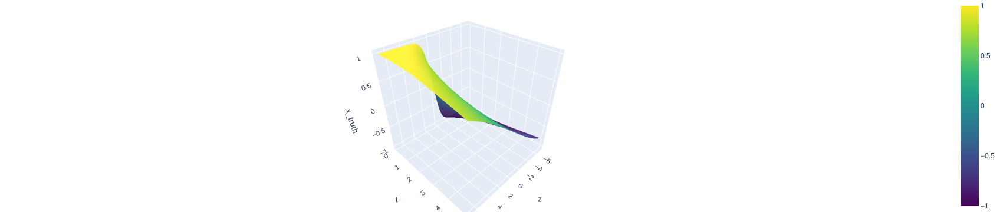

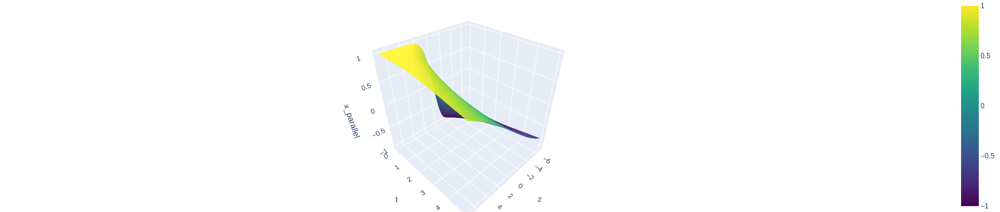

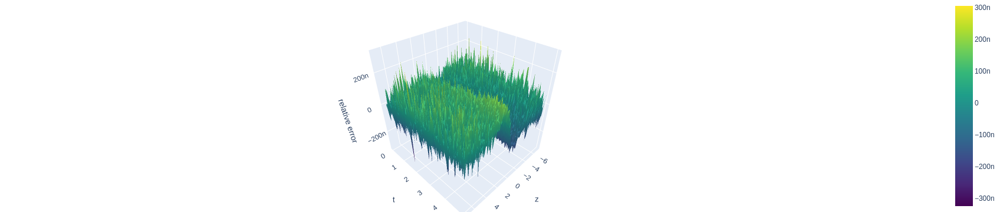

In [3]:
hz=0.1
ht = 0.05
Tmax = 5.0

x0 = lambda q: np.tanh(q)
G = lambda q: np.log(np.cosh(q))

z_vals, t_vals, X_tr1 = num_approx_burgers(x0, G, hz, ht, Tmax)
z_vals, t_vals, X_tr2 = solver.solve_single(
        x0,
        G,
        hz=0.1,
        ht=0.05,
        Tmax=5.0,
        n_quad_points=200
    )

# -------- interactive surface plot (Plotly) --------
plot_sim_result(z_vals, t_vals, X_tr1, 'x_truth')
plot_sim_result(z_vals, t_vals, X_tr2, 'x_parallel')
plot_sim_result(z_vals, t_vals, X_tr2-X_tr1, 'relative error')


PARALLEL BATCH PROCESSING BURGERS
Initialized BurgersParallelSolver on device: cuda
GPU: NVIDIA GeForce RTX 3060 Laptop GPU
GPU Memory: 6.10 GB

Done. Shapes:
  z_vals: (141,)   t_vals: (3001,)
  U_torch: (998, 3001, 141)  (N, nT, nz)


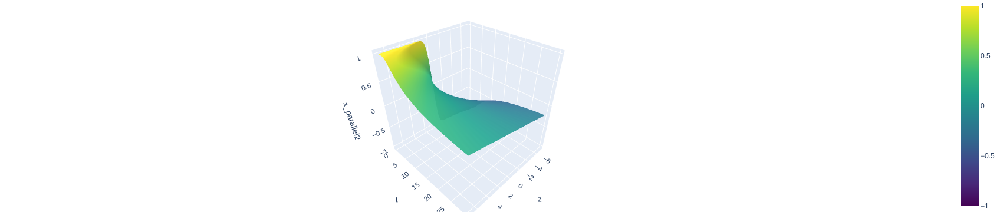

Computing exact Burgers soluton...: 3001it [09:48,  5.10it/s]


NameError: name 'X_tr1' is not defined

In [8]:
import math
import torch

class BurgersParallelSolver:
    """
    Optimized parallel Burgers equation solver using PyTorch.
    Supports batch processing of multiple initial conditions with GPU acceleration.
    """
    
    def __init__(self, device: str = None):
        """
        Initialize solver.
        
        Args:
            device: 'cuda', 'cpu', or None (auto-detect)
        """
        if device is None:
            self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        else:
            self.device = torch.device(device)
        
        print(f"Initialized BurgersParallelSolver on device: {self.device}")
        if self.device.type == 'cuda':
            print(f"GPU: {torch.cuda.get_device_name(0)}")
            print(f"GPU Memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.2f} GB")

    @staticmethod
    @torch.no_grad()
    def _interp_uniform_table(table: torch.Tensor, q: torch.Tensor, q0: float, dq: float) -> torch.Tensor:
        """
        table: (N, nq) sampled at q_grid[i]=q0+i*dq
        q: (...,) query points
        returns: (N, *q.shape)
        """
        N, nq = table.shape
        pos = (q - q0) / dq
        i0 = torch.floor(pos).to(torch.long).clamp(0, nq - 2)
        frac = (pos - i0.to(pos.dtype)).clamp(0.0, 1.0)

        i0f = i0.reshape(-1)                      # (M,)
        fracf = frac.reshape(-1)                  # (M,)

        idx = i0f.unsqueeze(0).expand(N, -1)      # (N,M)
        v0 = torch.gather(table, 1, idx)
        v1 = torch.gather(table, 1, idx + 1)
        out = v0 * (1.0 - fracf) + v1 * fracf     # (N,M)

        return out.view(N, *q.shape)

    @torch.no_grad()
    def _tables_from_callables(
        self,
        x0_list,
        G_list,
        q_grid: torch.Tensor,
        compute_G_if_missing: bool = True,
        shift_G0_to_zero: bool = False,
    ):
        """
        Builds x0_table, G_table on q_grid.

        - Evaluates each callable ONCE on the full grid (vectorized in q).
        - Loops over initial conditions only during this table construction stage.
          The solver itself is fully batched across ICs.

        Returns: (x0_table, G_table, q0, dq)
        """
        device = self.device
        dtype = q_grid.dtype
        q_np = q_grid.detach().cpu().numpy()

        # x0_table
        x0_rows = []
        for f in x0_list:
            # try torch path
            try:
                y = f(q_grid)
                if isinstance(y, torch.Tensor):
                    y_t = y.to(device=device, dtype=dtype)
                else:
                    raise TypeError
            except Exception:
                y_np = f(q_np)
                y_t = torch.as_tensor(np.asarray(y_np), device=device, dtype=dtype)
            x0_rows.append(y_t.reshape(-1))
        x0_table = torch.stack(x0_rows, dim=0)  # (N, nq)

        # G_table
        if G_list is not None:
            assert len(G_list) == len(x0_list)
            G_rows = []
            for f in G_list:
                try:
                    y = f(q_grid)
                    if isinstance(y, torch.Tensor):
                        y_t = y.to(device=device, dtype=dtype)
                    else:
                        raise TypeError
                except Exception:
                    y_np = f(q_np)
                    y_t = torch.as_tensor(np.asarray(y_np), device=device, dtype=dtype)
                G_rows.append(y_t.reshape(-1))
            G_table = torch.stack(G_rows, dim=0)
        else:
            if not compute_G_if_missing:
                raise ValueError("G_list is None and compute_G_if_missing=False.")
            dq = float((q_grid[1] - q_grid[0]).item())
            incr = 0.5 * (x0_table[:, 1:] + x0_table[:, :-1]) * dq
            G_table = torch.cat(
                [torch.zeros((x0_table.shape[0], 1), device=device, dtype=dtype),
                 torch.cumsum(incr, dim=1)],
                dim=1,
            )

        if shift_G0_to_zero:
            # subtract G(0) row-wise using interpolation on the uniform grid
            q0 = float(q_grid[0].item())
            dq = float((q_grid[1] - q_grid[0]).item())
            G0 = self._interp_uniform_table(G_table, torch.tensor(0.0, device=device, dtype=dtype), q0=q0, dq=dq)
            G_table = G_table - G0[:, 0:1]

        q0 = float(q_grid[0].item())
        dq = float((q_grid[1] - q_grid[0]).item())
        return x0_table, G_table, q0, dq

    @torch.no_grad()
    def _solve_from_tables(
        self,
        x0_table: torch.Tensor,   # (N, nq)
        G_table: torch.Tensor,    # (N, nq)
        q0: float,
        dq: float,
        hz: float,
        ht: float,
        Tmax: float,
        z_range=(-7.0, 7.0),
        L: float = 6.0,
        n_quad_points: int = 200,
        P: torch.Tensor = None,   # (nz, K) projection matrix, optional
        z_batch_size: int = 4096,
    ):
        device = self.device
        dtype = x0_table.dtype

        z = torch.arange(z_range[0], z_range[1] + 0.5*hz, hz, device=device, dtype=dtype)
        t = torch.arange(0.0, Tmax + 0.5*ht, ht, device=device, dtype=dtype)
        nz = z.numel()
        nT = t.numel()
        N = x0_table.shape[0]

        y = torch.linspace(-L, L, n_quad_points, device=device, dtype=dtype)
        dy = (y[1] - y[0]).item()
        w_y = torch.ones_like(y)
        w_y[0] = 0.5
        w_y[-1] = 0.5
        y_sq = y * y

        if P is None:
            U_out = torch.empty((N, nT, nz), device=device, dtype=dtype)
        else:
            K = P.shape[1]
            C_out = torch.empty((N, nT, K), device=device, dtype=dtype)

        for it in range(nT):
            tt = t[it]
            if P is not None:
                c_t = torch.zeros((N, P.shape[1]), device=device, dtype=dtype)

            for zs in range(0, nz, z_batch_size):
                ze = min(zs + z_batch_size, nz)
                z_b = z[zs:ze]  # (bz,)
                bz = z_b.numel()

                if tt.item() == 0.0:
                    u_b = self._interp_uniform_table(x0_table, z_b, q0=q0, dq=dq)  # (N,bz)
                else:
                    a = 2.0 * torch.sqrt(tt)
                    q = z_b.view(bz, 1) + a * y.view(1, -1)  # (bz,nq)

                    x0_q = self._interp_uniform_table(x0_table, q, q0=q0, dq=dq)  # (N,bz,nq)
                    G_q  = self._interp_uniform_table(G_table,  q, q0=q0, dq=dq)  # (N,bz,nq)

                    exp_term = torch.exp(-y_sq.view(1,1,-1) - 0.5 * G_q)           # (N,bz,nq)
                    num = torch.sum(x0_q * exp_term * w_y.view(1,1,-1), dim=2) * dy
                    den = torch.sum(exp_term       * w_y.view(1,1,-1), dim=2) * dy
                    u_b = num / den                                                # (N,bz)

                if P is None:
                    U_out[:, it, zs:ze] = u_b
                else:
                    c_t += u_b @ P[zs:ze, :]

            if P is not None:
                C_out[:, it, :] = c_t

        z_vals = z.detach().cpu().numpy()
        t_vals = t.detach().cpu().numpy()
        return (z_vals, t_vals, U_out) if P is None else (z_vals, t_vals, C_out)

    @torch.no_grad()
    def solve_parallel_projected(
        self,
        x0_list,
        G_list=None,
        hz: float = 0.1,
        ht: float = 0.05,
        Tmax: float = 5.0,
        z_range=(-7.0, 7.0),
        L: float = 6.0,
        n_quad_points: int = 200,
        q_n: int = 8192,
        P: torch.Tensor = None,
        z_batch_size: int = 4096,
        compute_G_if_missing: bool = True,
        shift_G0_to_zero: bool = False,
    ):
        """
        Public API: takes lists of callables like your old solve_parallel, but
        converts them to tables first, then solves fully batched across ICs.

        Note: If your lambdas capture loop variables, use i=i (see example below).
        """
        assert len(x0_list) > 0
        if G_list is not None:
            assert len(G_list) == len(x0_list)

        # q grid wide enough for q = z + 2*sqrt(t)*y, y in [-L,L]
        q_min = z_range[0] - 2.0 * math.sqrt(Tmax) * L
        q_max = z_range[1] + 2.0 * math.sqrt(Tmax) * L
        q_grid = torch.linspace(q_min, q_max, q_n, device=self.device, dtype=torch.float32)

        x0_table, G_table, q0, dq = self._tables_from_callables(
            x0_list=x0_list,
            G_list=G_list,
            q_grid=q_grid,
            compute_G_if_missing=compute_G_if_missing,
            shift_G0_to_zero=shift_G0_to_zero,
        )

        return self._solve_from_tables(
            x0_table=x0_table,
            G_table=G_table,
            q0=q0,
            dq=dq,
            hz=hz,
            ht=ht,
            Tmax=Tmax,
            z_range=z_range,
            L=L,
            n_quad_points=n_quad_points,
            P=P,
            z_batch_size=z_batch_size,
        )



hz = 0.1
ht = 0.01
Tmax = 30.0

x0 = lambda q: np.tanh(q)
G = lambda q: np.log(np.cosh(q))

print("\n" + "="*60)
print("PARALLEL BATCH PROCESSING BURGERS")
print("="*60)

initial_conditions = []
labels = []

for i in range(2, 1000):
    initial_conditions.append(lambda q, i=i: np.tanh(i*q))
    labels.append(f"tanh({i}q)")

solver = BurgersParallelSolver()

z_vals, t_vals, U_torch = solver.solve_parallel_projected(
    x0_list=initial_conditions,
    G_list=None,              # <-- let solver compute G from x0_table
    hz=hz,
    ht=ht,
    Tmax=Tmax,
    n_quad_points=200,
    z_batch_size=300,         # batches z, not ICs
    q_n=8192,
    P=None,
    compute_G_if_missing=True
)

X_tr_list = [U_torch[i].detach().cpu().numpy() for i in range(len(initial_conditions))]

print(f"\nDone. Shapes:")
print(f"  z_vals: {z_vals.shape}   t_vals: {t_vals.shape}")
print(f"  U_torch: {tuple(U_torch.shape)}  (N, nT, nz)")

plot_sim_result(z_vals, t_vals, X_tr_list[0], "x_parallel2")

z_vals, t_vals, X_tr = num_approx_burgers(x0, G, hz, ht, Tmax)

# -------- interactive surface plot (Plotly) --------
plot_sim_result(z_vals, t_vals, X_tr, 'x_truth')
plot_sim_result(z_vals, t_vals, X_tr_list[0], 'x_parallel')
plot_sim_result(z_vals, t_vals, X_tr_list[0]-X_tr, 'relative error')


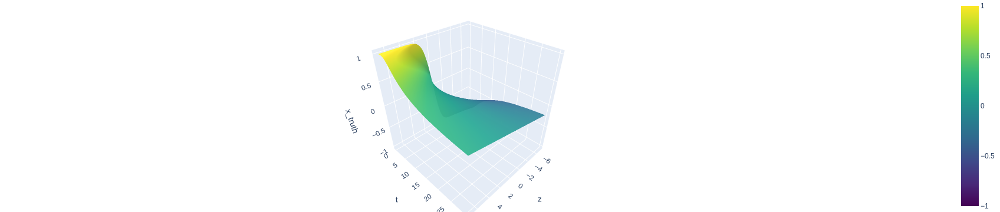

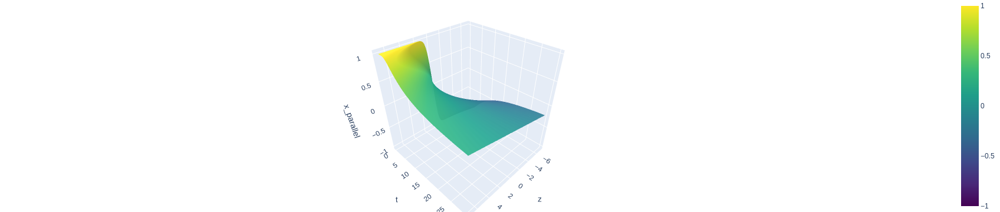

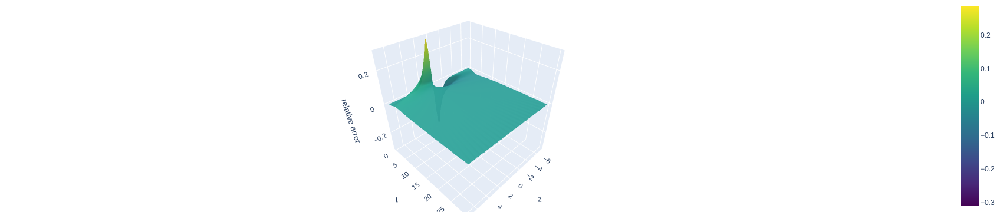

In [9]:
plot_sim_result(z_vals, t_vals, X_tr, 'x_truth')
plot_sim_result(z_vals, t_vals, X_tr_list[0], 'x_parallel')
plot_sim_result(z_vals, t_vals, X_tr_list[0]-X_tr, 'relative error')

# Equidistributed initial conditions

In [ ]:
import math
import numpy as np
import torch

# --- GPU helpers (Hermite + sphere) consistent with make_hermite_basis_eval --- :contentReference[oaicite:0]{index=0}
@torch.no_grad()
def sobol_sphere(N: int, K: int, device, dtype) -> torch.Tensor:
    eng = torch.quasirandom.SobolEngine(dimension=K, scramble=False)
    U = eng.draw(N).to(device=device, dtype=dtype)
    eps = torch.finfo(dtype).eps
    U = U.clamp(eps, 1 - eps)
    G = math.sqrt(2.0) * torch.erfinv(2 * U - 1)
    return G / G.norm(dim=1, keepdim=True)

@torch.no_grad()
def trapz_weights_1d_torch(x: torch.Tensor) -> torch.Tensor:
    w = torch.empty_like(x)
    w[0]  = 0.5 * (x[1] - x[0])
    w[-1] = 0.5 * (x[-1] - x[-2])
    w[1:-1] = 0.5 * (x[2:] - x[:-2])
    return w

@torch.no_grad()
def hermite_basis_x_torch(x: torch.Tensor, K: int, scale: float, shift: float) -> torch.Tensor:
    # phi_k(x) = (1/sqrt(scale)) * [exp(-y^2/2) H_k(y) / sqrt(2^k k! sqrt(pi))], y=(x-shift)/scale :contentReference[oaicite:1]{index=1}
    y = (x - shift) / scale
    y_flat = y.reshape(-1)
    M = y_flat.numel()

    H = torch.empty((K, M), device=x.device, dtype=x.dtype)
    H[0].fill_(1.0)
    if K >= 2:
        H[1] = 2.0 * y_flat
    for k in range(2, K):
        H[k] = 2.0 * y_flat * H[k-1] - 2.0 * (k-1) * H[k-2]

    k = torch.arange(K, device=x.device, dtype=x.dtype)
    log_denom = 0.5 * (k * math.log(2.0) + torch.lgamma(k + 1.0) + 0.5 * math.log(math.pi))
    c = torch.exp(-log_denom)

    Phi_y = (c[:, None] * torch.exp(-0.5 * y_flat**2)[None, :]) * H
    Phi_y = Phi_y.reshape(K, *y.shape)
    return Phi_y / math.sqrt(scale)

@torch.no_grad()
def interp_time_batch(t_grid: torch.Tensor, C_grid: torch.Tensor, t_query: torch.Tensor) -> torch.Tensor:
    """
    t_grid: (nTg,), C_grid: (N,nTg,K), t_query: (nT,)
    returns: (N,nT,K) linear interpolation in time
    """
    tq = t_query.clamp(t_grid[0], t_grid[-1])
    idx = torch.searchsorted(t_grid, tq, right=False).clamp(1, t_grid.numel() - 1)
    t_lo = t_grid[idx - 1]
    t_hi = t_grid[idx]
    w = (tq - t_lo) / (t_hi - t_lo)

    C_lo = C_grid[:, idx - 1, :]  # (N,nT,K)
    C_hi = C_grid[:, idx, :]
    return C_lo * (1.0 - w)[None, :, None] + C_hi * w[None, :, None]


def burgers_neura_galerkin_ds(
    solver, #BurgersParallelSolver
    N: int,
    K: int,
    hz: float = 0.1,
    Tmax: float = 5.0,
    z_range=(-7.0, 7.0),
    L: float = 6.0,
    n_quad_points: int = 200,
    q_n: int = 8192,
    z_batch_size: int = 4096,
    sphere_mode: str = "coeff",  # "coeff" (Euclidean) or "l2" (discrete-L2 on z-grid)
    n_time_samples: int = 200,
    t_sampling: str = "grid",    # "grid" or "random" (random done by post-interp)
    seed: int = 0,
    normalize_t: bool = False,
    normalize_c: bool = False,
    return_k_coords: bool = False,
    dtype: torch.dtype = torch.float32,
):
    """
    Generates N trajectories where IC coeffs are (quasi-)equisdistributed on S^{K-1},
    solves Burgers with solver.solve_parallel_projected(...), and returns NeuralGalerkinDataset.

    Uses projection matrix definition in neural_galerkin_ode.projection_matrix. :contentReference[oaicite:2]{index=2}
    """
    from .neural_galerkin_ode import NeuralGalerkinDataset, NeuralGalerkinDatasetConfig  # :contentReference[oaicite:3]{index=3}

    device = solver.device

    # spatial grid used by solver
    z = torch.arange(z_range[0], z_range[1] + 0.5 * hz, hz, device=device, dtype=dtype)
    nz = z.numel()

    # Hermite parameters consistent with your burgers_dataset choice (range/6, mid shift). :contentReference[oaicite:4]{index=4}
    shift = 0.5 * (z_range[0] + z_range[1])
    scale = (z_range[1] - z_range[0]) / 6.0

    # basis on z + projection matrix P (nz,K): c(t) = u(t,.) @ P :contentReference[oaicite:5]{index=5}
    Phi_z = hermite_basis_x_torch(z, K, scale=scale, shift=shift)     # (K,nz)
    w_z = trapz_weights_1d_torch(z)                                   # (nz,)
    P = (w_z.unsqueeze(0) * Phi_z).t().contiguous()                   # (nz,K)

    # coefficients on sphere
    A = sobol_sphere(N, K, device=device, dtype=dtype)                # (N,K)
    if sphere_mode == "l2":
        M = (Phi_z * w_z.unsqueeze(0)) @ Phi_z.t()
        M = 0.5 * (M + M.t()) + 1e-10 * torch.eye(K, device=device, dtype=dtype)
        Lc = torch.linalg.cholesky(M)
        Ccoeff = torch.linalg.solve_triangular(Lc.t(), A.t(), upper=True).t()
    else:
        Ccoeff = A

    # Precompute x0_table and G_table on the same q_grid solver will use
    q_min = z_range[0] - 2.0 * math.sqrt(Tmax) * L
    q_max = z_range[1] + 2.0 * math.sqrt(Tmax) * L
    q_grid = torch.linspace(q_min, q_max, q_n, device=device, dtype=dtype)
    Phi_q = hermite_basis_x_torch(q_grid, K, scale=scale, shift=shift)      # (K,q_n)
    x0_table = Ccoeff @ Phi_q                                               # (N,q_n)

    dq = (q_grid[1] - q_grid[0]).item()
    incr = 0.5 * (x0_table[:, 1:] + x0_table[:, :-1]) * dq
    G_table = torch.cat([torch.zeros((N, 1), device=device, dtype=dtype),
                         torch.cumsum(incr, dim=1)], dim=1)                 # (N,q_n)

    # Wrap tables as callables so we can reuse solve_parallel_projected API
    def row_fn_torch(table, i):
        row = table[i]
        def f(q, row=row):
            # _tables_from_callables calls once on q_grid; we just return the row
            if isinstance(q, torch.Tensor):
                return row
            return row.detach().cpu().numpy()
        return f

    x0_list = [row_fn_torch(x0_table, i) for i in range(N)]
    G_list  = [row_fn_torch(G_table,  i) for i in range(N)]

    # Solve on the solver's native time grid, but already projected (P != None)
    # ht here only controls *sampling times* in the solver (it’s not a time-stepping PDE integrator).
    ht = hz**2
    z_vals, t_vals, C_grid = solver.solve_parallel_projected(
        x0_list=x0_list,
        G_list=G_list,
        hz=hz,
        ht=ht,
        Tmax=Tmax,
        z_range=z_range,
        L=L,
        n_quad_points=n_quad_points,
        q_n=q_n,
        P=P,
        z_batch_size=z_batch_size,
        compute_G_if_missing=False,
    )  # C_grid: (N,nTg,K) torch on device

    # Resample in time to n_time_samples if requested
    t_grid = torch.tensor(t_vals, device=device, dtype=dtype)
    if t_sampling == "grid":
        t_target = torch.linspace(0.0, Tmax, n_time_samples, device=device, dtype=dtype)
    elif t_sampling == "random":
        rng = np.random.default_rng(seed)
        tt = rng.uniform(0.0, Tmax, size=(n_time_samples,)).astype(np.float32)
        tt.sort()
        tt[0] = 0.0
        t_target = torch.tensor(tt, device=device, dtype=dtype)
    else:
        raise ValueError("t_sampling must be 'grid' or 'random'")

    if n_time_samples != len(t_vals) or (t_sampling != "grid" or not np.allclose(t_vals, np.linspace(0.0, Tmax, len(t_vals)))):
        C_target = interp_time_batch(t_grid, C_grid, t_target)  # (N,nT,K)
    else:
        C_target = C_grid
        t_target = t_grid

    # Build dataset (constructor expects numpy)
    T_all = t_target.detach().cpu().numpy()[None, :].repeat(N, axis=0)
    C_all = C_target.detach().cpu().numpy()
    Phi_np = Phi_z.detach().cpu().numpy()

    cfg = NeuralGalerkinDatasetConfig(
        n_time_samples=int(T_all.shape[1]),
        t_sampling=t_sampling,
        seed=seed,
        normalize_t=normalize_t,
        normalize_c=normalize_c,
        return_k_coords=return_k_coords,
        pde_name="burgers",
    )

    return NeuralGalerkinDataset(
        config=cfg,
        t=T_all,
        c=C_all,
        device=str(device),
        dtype=dtype,
        x_grid=z_vals,
        basis_matrix=Phi_np,
    )
